notes : 
main focus is on sales df, dates df might be useful , dont knwo use of weights

In [67]:
#basic imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error

In [2]:
#collecting all data
sales_train_df = pd.read_csv('sales_train.csv')
sales_test_df = pd.read_csv('sales_test.csv')
inventory_df = pd.read_csv('inventory.csv')
dates_df = pd.read_csv('calendar.csv')
weights_df = pd.read_csv('test_weights.csv')

In [3]:
sales_train_df.head()

,unique_id,date,warehouse,total_orders,sales,sell_price_main,availability,type_0_discount,type_1_discount,type_2_discount,type_3_discount,type_4_discount,type_5_discount,type_6_discount
0,4845,2024-03-10,Budapest_1,6436.0,16.34,646.26,1.00,0.00000,0.0,0.0,0.0,0.15312,0.0,0.0
1,4845,2021-05-25,Budapest_1,4663.0,12.63,455.96,1.00,0.00000,0.0,0.0,0.0,0.15025,0.0,0.0
2,4845,2021-12-20,Budapest_1,6507.0,34.55,455.96,1.00,0.00000,0.0,0.0,0.0,0.15025,0.0,0.0
3,4845,2023-04-29,Budapest_1,5463.0,34.52,646.26,0.96,0.20024,0.0,0.0,0.0,0.15312,0.0,0.0
4,4845,2022-04-01,Budapest_1,5997.0,35.92,486.41,1.00,0.00000,0.0,0.0,0.0,0.15649,0.0,0.0


In [4]:
sales_test_df.head()

,unique_id,date,warehouse,total_orders,sell_price_main,type_0_discount,type_1_discount,type_2_discount,type_3_discount,type_4_discount,type_5_discount,type_6_discount
0,1226,2024-06-03,Brno_1,8679.0,13.13,0.00000,0.0,0.0,0.0,0.0,0.0,0.0
1,1226,2024-06-11,Brno_1,8795.0,13.13,0.15873,0.0,0.0,0.0,0.0,0.0,0.0
2,1226,2024-06-13,Brno_1,10009.0,13.13,0.15873,0.0,0.0,0.0,0.0,0.0,0.0
3,1226,2024-06-15,Brno_1,8482.0,13.13,0.15873,0.0,0.0,0.0,0.0,0.0,0.0
4,1226,2024-06-09,Brno_1,8195.0,13.13,0.00000,0.0,0.0,0.0,0.0,0.0,0.0


### sales is the target variable here

In [5]:
sales_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4007419 entries, 0 to 4007418
Data columns (total 14 columns):
 #   Column           Dtype  
---  ------           -----  
 0   unique_id        int64  
 1   date             object 
 2   warehouse        object 
 3   total_orders     float64
 4   sales            float64
 5   sell_price_main  float64
 6   availability     float64
 7   type_0_discount  float64
 8   type_1_discount  float64
 9   type_2_discount  float64
 10  type_3_discount  float64
 11  type_4_discount  float64
 12  type_5_discount  float64
 13  type_6_discount  float64
dtypes: float64(11), int64(1), object(2)
memory usage: 428.0+ MB


In [6]:
sales_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47021 entries, 0 to 47020
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   unique_id        47021 non-null  int64  
 1   date             47021 non-null  object 
 2   warehouse        47021 non-null  object 
 3   total_orders     47021 non-null  float64
 4   sell_price_main  47021 non-null  float64
 5   type_0_discount  47021 non-null  float64
 6   type_1_discount  47021 non-null  float64
 7   type_2_discount  47021 non-null  float64
 8   type_3_discount  47021 non-null  float64
 9   type_4_discount  47021 non-null  float64
 10  type_5_discount  47021 non-null  float64
 11  type_6_discount  47021 non-null  float64
dtypes: float64(9), int64(1), object(2)
memory usage: 4.3+ MB


In [7]:
dates_df.head()

,date,holiday_name,holiday,shops_closed,winter_school_holidays,school_holidays,warehouse
0,2022-03-16,NaN,0,0,0,0,Frankfurt_1
1,2020-03-22,NaN,0,0,0,0,Frankfurt_1
2,2018-02-07,NaN,0,0,0,0,Frankfurt_1
3,2018-08-10,NaN,0,0,0,0,Frankfurt_1
4,2017-10-26,NaN,0,0,0,0,Prague_2


In [8]:
inventory_df.head()

,unique_id,product_unique_id,name,L1_category_name_en,L2_category_name_en,L3_category_name_en,L4_category_name_en,warehouse
0,5255,2583,Pastry_196,Bakery,Bakery_L2_14,Bakery_L3_26,Bakery_L4_1,Prague_3
1,4948,2426,Herb_19,Fruit and vegetable,Fruit and vegetable_L2_30,Fruit and vegetable_L3_86,Fruit and vegetable_L4_1,Prague_3
2,2146,1079,Beet_2,Fruit and vegetable,Fruit and vegetable_L2_3,Fruit and vegetable_L3_65,Fruit and vegetable_L4_34,Prague_1
3,501,260,Chicken_13,Meat and fish,Meat and fish_L2_13,Meat and fish_L3_27,Meat and fish_L4_5,Prague_1
4,4461,2197,Chicory_1,Fruit and vegetable,Fruit and vegetable_L2_17,Fruit and vegetable_L3_33,Fruit and vegetable_L4_1,Frankfurt_1


In [9]:
sales_train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
unique_id,4007419.0,2740.801319,1558.566407,0.00000,1398.00,2744.00,4084.00,5431.00000
total_orders,4007367.0,5995.722112,2479.597800,458.00000,4402.00,5515.00,8011.00,18475.00000
sales,4007367.0,108.380753,360.332735,0.00000,17.98,39.52,94.47,26316.19000
sell_price_main,4007419.0,181.419909,461.101407,0.02000,21.13,45.64,112.13,21682.99000
availability,4007419.0,0.925311,0.179621,0.01000,1.00,1.00,1.00,1.00000
type_0_discount,4007419.0,0.008519,0.051470,-20.94930,0.00,0.00,0.00,0.99164
type_1_discount,4007419.0,0.000124,0.005143,0.00000,0.00,0.00,0.00,0.50000
type_2_discount,4007419.0,0.001163,0.018800,0.00000,0.00,0.00,0.00,0.76372
type_3_discount,4007419.0,0.000005,0.000892,0.00000,0.00,0.00,0.00,0.25063
type_4_discount,4007419.0,0.005680,0.028930,-0.04712,0.00,0.00,0.00,0.45290


In [10]:
sales_test_df.describe().T

,count,mean,std,min,25%,50%,75%,max
unique_id,47021.0,2749.678016,1551.488719,1.00,1417.00,2767.00,4076.00,5431.00000
total_orders,47021.0,6880.911337,2525.038306,1189.00,5390.00,6382.00,8919.00,12374.00000
sell_price_main,47021.0,206.350987,525.128185,0.13,20.11,49.04,120.58,11084.52000
type_0_discount,47021.0,0.013532,0.059923,0.00,0.00,0.00,0.00,0.88558
type_1_discount,47021.0,0.000251,0.007095,0.00,0.00,0.00,0.00,0.20100
type_2_discount,47021.0,0.004904,0.028592,0.00,0.00,0.00,0.00,0.50063
type_3_discount,47021.0,0.000000,0.000000,0.00,0.00,0.00,0.00,0.00000
type_4_discount,47021.0,0.007142,0.032099,0.00,0.00,0.00,0.00,0.35770
type_5_discount,47021.0,0.000483,0.010956,0.00,0.00,0.00,0.00,0.35765
type_6_discount,47021.0,0.008359,0.043834,0.00,0.00,0.00,0.00,0.90000


In [11]:
from ydata_profiling import ProfileReport
report = ProfileReport(sales_train_df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### remove null and outliers

In [12]:
sales_train_df.isna().sum()

unique_id           0
date                0
warehouse           0
total_orders       52
sales              52
sell_price_main     0
availability        0
type_0_discount     0
type_1_discount     0
type_2_discount     0
type_3_discount     0
type_4_discount     0
type_5_discount     0
type_6_discount     0
dtype: int64

In [13]:
sales_test_df.isna().sum()

unique_id          0
date               0
warehouse          0
total_orders       0
sell_price_main    0
type_0_discount    0
type_1_discount    0
type_2_discount    0
type_3_discount    0
type_4_discount    0
type_5_discount    0
type_6_discount    0
dtype: int64

In [14]:
sales_train_df.dropna(inplace=True)

In [15]:
#duplicates
sales_train_df.drop_duplicates(inplace=True)
sales_test_df.drop_duplicates(inplace=True)

In [16]:
#outliers in discount
sales_train_df.describe().T.style.background_gradient('viridis')

,count,mean,std,min,25%,50%,75%,max
unique_id,4007367.000000,2740.804345,1558.569985,0.000000,1398.000000,2744.000000,4084.000000,5431.000000
total_orders,4007367.000000,5995.722112,2479.597800,458.000000,4402.000000,5515.000000,8011.000000,18475.000000
sales,4007367.000000,108.380753,360.332735,0.000000,17.980000,39.520000,94.470000,26316.190000
sell_price_main,4007367.000000,181.422218,461.103954,0.020000,21.130000,45.640000,112.130000,21682.990000
availability,4007367.000000,0.925311,0.179620,0.010000,1.000000,1.000000,1.000000,1.000000
type_0_discount,4007367.000000,0.008518,0.051469,-20.949300,0.000000,0.000000,0.000000,0.991640
type_1_discount,4007367.000000,0.000124,0.005143,0.000000,0.000000,0.000000,0.000000,0.500000
type_2_discount,4007367.000000,0.001163,0.018800,0.000000,0.000000,0.000000,0.000000,0.763720
type_3_discount,4007367.000000,0.000005,0.000892,0.000000,0.000000,0.000000,0.000000,0.250630
type_4_discount,4007367.000000,0.005680,0.028930,-0.047120,0.000000,0.000000,0.000000,0.452900


In [17]:
cols = ['type_0_discount','type_4_discount','type_6_discount']
for col in cols:
    sales_train_df[col] = sales_train_df[col].apply(lambda x : 0 if x < 0 else x)

In [18]:
#outliers in discount are removed
sales_train_df.describe().T.style.background_gradient('viridis')

,count,mean,std,min,25%,50%,75%,max
unique_id,4007367.000000,2740.804345,1558.569985,0.000000,1398.000000,2744.000000,4084.000000,5431.000000
total_orders,4007367.000000,5995.722112,2479.597800,458.000000,4402.000000,5515.000000,8011.000000,18475.000000
sales,4007367.000000,108.380753,360.332735,0.000000,17.980000,39.520000,94.470000,26316.190000
sell_price_main,4007367.000000,181.422218,461.103954,0.020000,21.130000,45.640000,112.130000,21682.990000
availability,4007367.000000,0.925311,0.179620,0.010000,1.000000,1.000000,1.000000,1.000000
type_0_discount,4007367.000000,0.008532,0.048937,0.000000,0.000000,0.000000,0.000000,0.991640
type_1_discount,4007367.000000,0.000124,0.005143,0.000000,0.000000,0.000000,0.000000,0.500000
type_2_discount,4007367.000000,0.001163,0.018800,0.000000,0.000000,0.000000,0.000000,0.763720
type_3_discount,4007367.000000,0.000005,0.000892,0.000000,0.000000,0.000000,0.000000,0.250630
type_4_discount,4007367.000000,0.005680,0.028930,0.000000,0.000000,0.000000,0.000000,0.452900


### convert date into y,m,d

In [19]:
sales_train_df['date'] = pd.to_datetime(sales_train_df['date'])
sales_test_df['date'] = pd.to_datetime(sales_test_df['date'])

In [20]:
sales_train_df['Year'] = sales_train_df['date'].dt.year
sales_test_df['Year'] = sales_test_df['date'].dt.year
sales_train_df['Month'] = sales_train_df['date'].dt.month
sales_test_df['Month'] = sales_test_df['date'].dt.month
sales_train_df['Day'] = sales_train_df['date'].dt.day
sales_test_df['Day'] = sales_test_df['date'].dt.day

In [21]:
sales_train_df.head()

,unique_id,date,warehouse,total_orders,sales,sell_price_main,availability,type_0_discount,type_1_discount,type_2_discount,type_3_discount,type_4_discount,type_5_discount,type_6_discount,Year,Month,Day
0,4845,2024-03-10,Budapest_1,6436.0,16.34,646.26,1.00,0.00000,0.0,0.0,0.0,0.15312,0.0,0.0,2024,3,10
1,4845,2021-05-25,Budapest_1,4663.0,12.63,455.96,1.00,0.00000,0.0,0.0,0.0,0.15025,0.0,0.0,2021,5,25
2,4845,2021-12-20,Budapest_1,6507.0,34.55,455.96,1.00,0.00000,0.0,0.0,0.0,0.15025,0.0,0.0,2021,12,20
3,4845,2023-04-29,Budapest_1,5463.0,34.52,646.26,0.96,0.20024,0.0,0.0,0.0,0.15312,0.0,0.0,2023,4,29
4,4845,2022-04-01,Budapest_1,5997.0,35.92,486.41,1.00,0.00000,0.0,0.0,0.0,0.15649,0.0,0.0,2022,4,1


In [22]:
sales_test_df.head()

,unique_id,date,warehouse,total_orders,sell_price_main,type_0_discount,type_1_discount,type_2_discount,type_3_discount,type_4_discount,type_5_discount,type_6_discount,Year,Month,Day
0,1226,2024-06-03,Brno_1,8679.0,13.13,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,2024,6,3
1,1226,2024-06-11,Brno_1,8795.0,13.13,0.15873,0.0,0.0,0.0,0.0,0.0,0.0,2024,6,11
2,1226,2024-06-13,Brno_1,10009.0,13.13,0.15873,0.0,0.0,0.0,0.0,0.0,0.0,2024,6,13
3,1226,2024-06-15,Brno_1,8482.0,13.13,0.15873,0.0,0.0,0.0,0.0,0.0,0.0,2024,6,15
4,1226,2024-06-09,Brno_1,8195.0,13.13,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,2024,6,9


### converting Dtype for memory efficiency

In [23]:
for col in sales_train_df.select_dtypes(include='number').columns:
    if sales_train_df[col].dtypes == 'float64':
        sales_train_df[col] = sales_train_df[col].astype('float16')
    elif sales_train_df[col].dtypes == 'int64':
        sales_train_df[col] = sales_train_df[col].astype('int16')
    elif sales_train_df[col].dtypes == 'int32':
        sales_train_df[col] = sales_train_df[col].astype('int16')

### Try : not changing dtypes for test

In [24]:
for col in sales_test_df.select_dtypes(include='number').columns:
    if sales_test_df[col].dtypes == 'float64':
        sales_test_df[col] = sales_test_df[col].astype('float16')
    elif sales_test_df[col].dtypes == 'int64':
        sales_test_df[col] = sales_test_df[col].astype('int16')
    elif sales_test_df[col].dtypes == 'int32':
        sales_test_df[col] = sales_test_df[col].astype('int16')

In [25]:
sales_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4007367 entries, 0 to 4007418
Data columns (total 17 columns):
 #   Column           Dtype         
---  ------           -----         
 0   unique_id        int16         
 1   date             datetime64[ns]
 2   warehouse        object        
 3   total_orders     float16       
 4   sales            float16       
 5   sell_price_main  float16       
 6   availability     float16       
 7   type_0_discount  float16       
 8   type_1_discount  float16       
 9   type_2_discount  float16       
 10  type_3_discount  float16       
 11  type_4_discount  float16       
 12  type_5_discount  float16       
 13  type_6_discount  float16       
 14  Year             int16         
 15  Month            int16         
 16  Day              int16         
dtypes: datetime64[ns](1), float16(11), int16(4), object(1)
memory usage: 206.4+ MB


In [26]:
sales_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47021 entries, 0 to 47020
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   unique_id        47021 non-null  int16         
 1   date             47021 non-null  datetime64[ns]
 2   warehouse        47021 non-null  object        
 3   total_orders     47021 non-null  float16       
 4   sell_price_main  47021 non-null  float16       
 5   type_0_discount  47021 non-null  float16       
 6   type_1_discount  47021 non-null  float16       
 7   type_2_discount  47021 non-null  float16       
 8   type_3_discount  47021 non-null  float16       
 9   type_4_discount  47021 non-null  float16       
 10  type_5_discount  47021 non-null  float16       
 11  type_6_discount  47021 non-null  float16       
 12  Year             47021 non-null  int16         
 13  Month            47021 non-null  int16         
 14  Day              47021 non-null  int16

### warehouse column

In [27]:
sales_train_df['warehouse'].value_counts()

warehouse
Prague_1       780566
Prague_3       779655
Prague_2       770709
Brno_1         643637
Budapest_1     574582
Munich_1       259287
Frankfurt_1    198931
Name: count, dtype: int64

### total order per warehouse

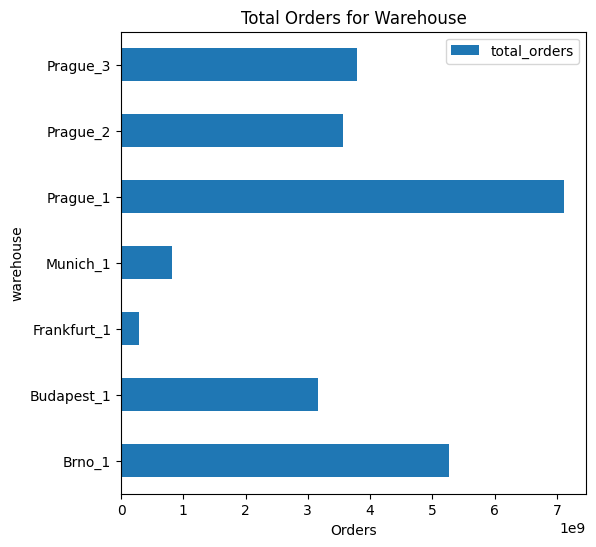

In [28]:
#most orders are from warehouses based in prague
%matplotlib inline
pd.DataFrame(sales_train_df.groupby('warehouse')['total_orders'].sum()).plot(kind='barh',figsize=(6,6))
plt.title('Total Orders for Warehouse')
plt.xlabel('Orders')
plt.show()

### total sales

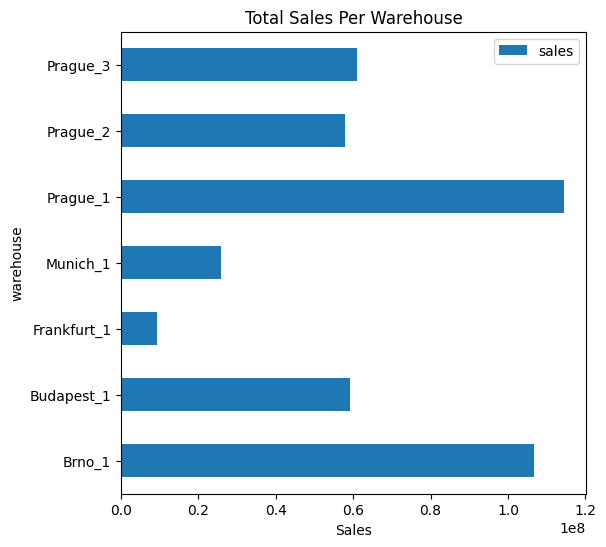

In [29]:
pd.DataFrame(sales_train_df.groupby('warehouse')['sales'].sum()).plot(kind='barh',figsize=(6,6))
plt.title('Total Sales Per Warehouse')
plt.xlabel('Sales')
plt.show()

### mean sales per warehouse

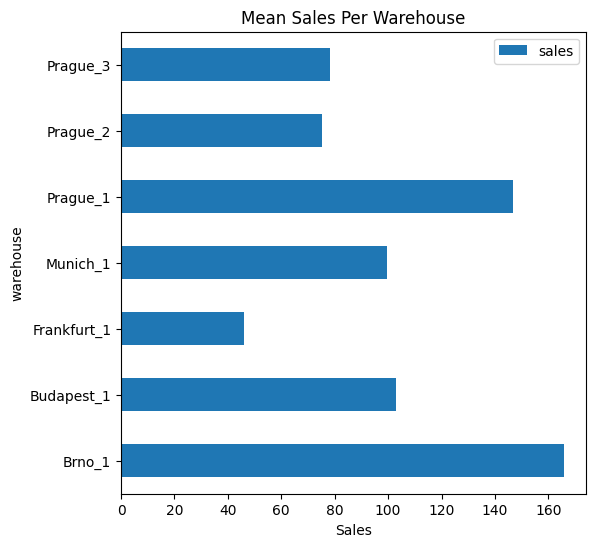

In [30]:
#highest average sales for Brno based warehouse
pd.DataFrame(sales_train_df.groupby('warehouse')['sales'].mean()).plot(kind='barh',figsize=(6,6))
plt.title('Mean Sales Per Warehouse')
plt.xlabel('Sales')
plt.show()

### countplot of warehouse

In [31]:
dates_df.info()
dates_df.drop('holiday_name',axis=1,inplace=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23016 entries, 0 to 23015
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   date                    23016 non-null  object
 1   holiday_name            930 non-null    object
 2   holiday                 23016 non-null  int64 
 3   shops_closed            23016 non-null  int64 
 4   winter_school_holidays  23016 non-null  int64 
 5   school_holidays         23016 non-null  int64 
 6   warehouse               23016 non-null  object
dtypes: int64(4), object(3)
memory usage: 1.2+ MB


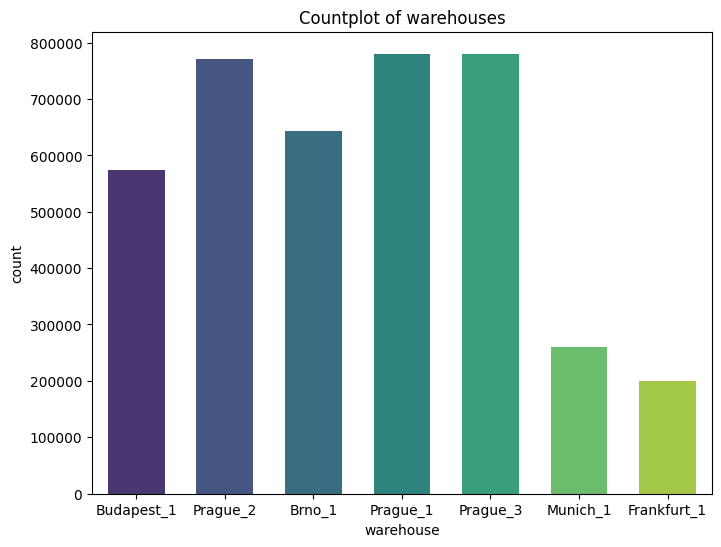

In [32]:
plt.figure(figsize=(8,6))
sns.countplot(x='warehouse',data=sales_train_df,palette='viridis',gap=0.2)
plt.title('Countplot of warehouses')
plt.show()

### converting into one hot 

In [33]:
col = 'warehouse'
sales_train_df = pd.get_dummies(sales_train_df,col)

In [34]:
sales_test_df = pd.get_dummies(sales_test_df,col)

In [35]:
sales_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47021 entries, 0 to 47020
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   unique_id              47021 non-null  int16         
 1   date                   47021 non-null  datetime64[ns]
 2   total_orders           47021 non-null  float16       
 3   sell_price_main        47021 non-null  float16       
 4   type_0_discount        47021 non-null  float16       
 5   type_1_discount        47021 non-null  float16       
 6   type_2_discount        47021 non-null  float16       
 7   type_3_discount        47021 non-null  float16       
 8   type_4_discount        47021 non-null  float16       
 9   type_5_discount        47021 non-null  float16       
 10  type_6_discount        47021 non-null  float16       
 11  Year                   47021 non-null  int16         
 12  Month                  47021 non-null  int16         
 13  D

### displot of discounts

In [36]:
def distribution_plots(df):   
    num_rows = 4
    num_cols = 2
    columns = ['type_0_discount', 'type_1_discount', 'type_2_discount',
       'type_3_discount', 'type_4_discount', 'type_5_discount',
       'type_6_discount']

    fig,axes = plt.subplots(nrows=num_rows,ncols=num_cols,figsize=(25,25))

    for i,column in enumerate(columns):
        row = i //2
        col = i%2
        ax = axes[row,col]
        sns.histplot(x=column,data=df,kde=True,bins=50,ax=ax)
        ax.set_title(f"Distribution plot of {column}")
        ax.set_xlabel(column)
    plt.tight_layout()
    plt.show()
    plt.close()

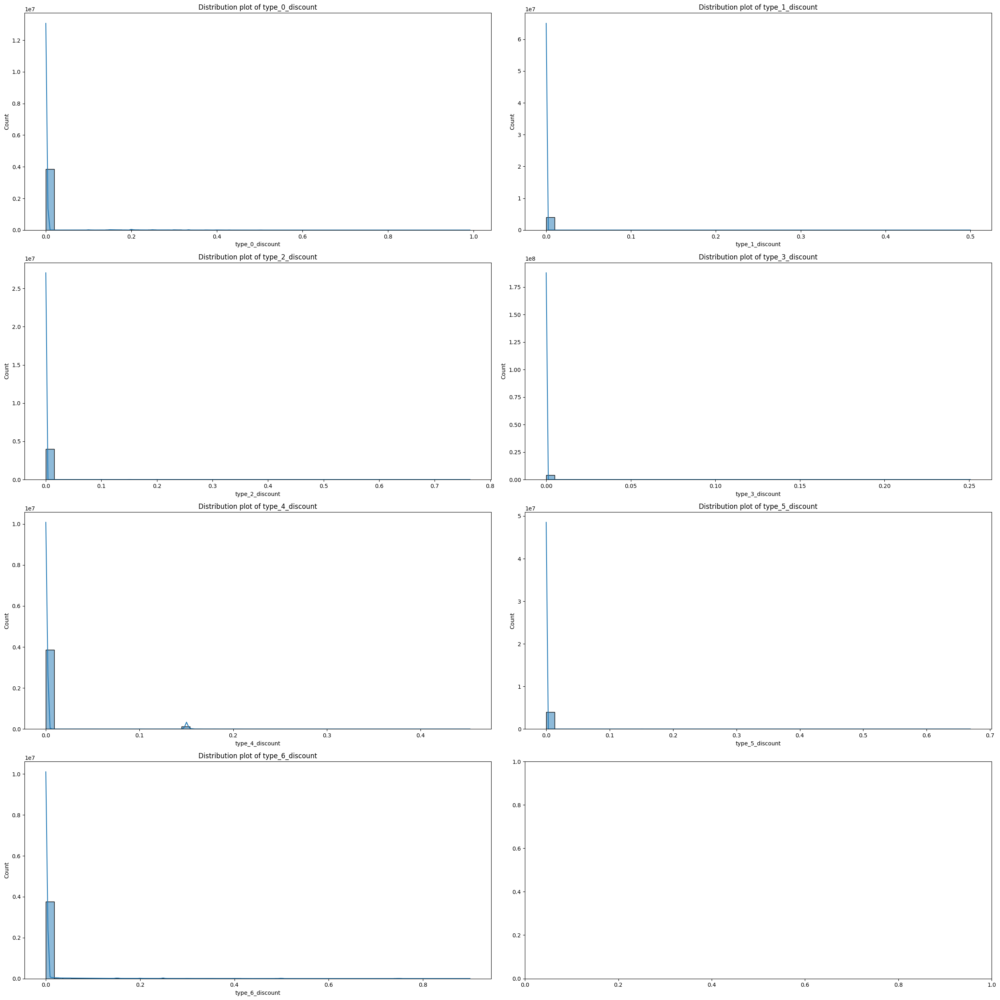

In [37]:
distribution_plots(sales_train_df)

### column to check if any kind of discount is available

In [38]:
sales_train_df['Discount'] = sales_train_df[['type_0_discount', 'type_1_discount', 'type_2_discount',
       'type_3_discount', 'type_4_discount', 'type_5_discount',
       'type_6_discount']].apply(lambda x : x.gt(0.0).any(),axis=1)

In [39]:
sales_test_df['Discount'] = sales_test_df[['type_0_discount', 'type_1_discount', 'type_2_discount',
       'type_3_discount', 'type_4_discount', 'type_5_discount',
       'type_6_discount']].apply(lambda x : x.gt(0.0).any(),axis=1)

In [40]:
sales_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4007367 entries, 0 to 4007418
Data columns (total 24 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   unique_id              int16         
 1   date                   datetime64[ns]
 2   total_orders           float16       
 3   sales                  float16       
 4   sell_price_main        float16       
 5   availability           float16       
 6   type_0_discount        float16       
 7   type_1_discount        float16       
 8   type_2_discount        float16       
 9   type_3_discount        float16       
 10  type_4_discount        float16       
 11  type_5_discount        float16       
 12  type_6_discount        float16       
 13  Year                   int16         
 14  Month                  int16         
 15  Day                    int16         
 16  warehouse_Brno_1       bool          
 17  warehouse_Budapest_1   bool          
 18  warehouse_Frankfurt_1  bool

### more than 50% discount

In [41]:
sales_train_df['Discount_50'] = sales_train_df[['type_0_discount', 'type_1_discount', 'type_2_discount',
       'type_3_discount', 'type_4_discount', 'type_5_discount',
       'type_6_discount']].apply(lambda x : x.gt(0.5).any(),axis=1)
sales_test_df['Discount_50'] = sales_test_df[['type_0_discount', 'type_1_discount', 'type_2_discount',
       'type_3_discount', 'type_4_discount', 'type_5_discount',
       'type_6_discount']].apply(lambda x : x.gt(0.5).any(),axis=1)

In [42]:
sales_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4007367 entries, 0 to 4007418
Data columns (total 25 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   unique_id              int16         
 1   date                   datetime64[ns]
 2   total_orders           float16       
 3   sales                  float16       
 4   sell_price_main        float16       
 5   availability           float16       
 6   type_0_discount        float16       
 7   type_1_discount        float16       
 8   type_2_discount        float16       
 9   type_3_discount        float16       
 10  type_4_discount        float16       
 11  type_5_discount        float16       
 12  type_6_discount        float16       
 13  Year                   int16         
 14  Month                  int16         
 15  Day                    int16         
 16  warehouse_Brno_1       bool          
 17  warehouse_Budapest_1   bool          
 18  warehouse_Frankfurt_1  bool

In [43]:
sales_train_df['total_discount'] = sales_train_df[['type_0_discount', 'type_1_discount', 'type_2_discount',
       'type_3_discount', 'type_4_discount', 'type_5_discount',
       'type_6_discount']].apply(lambda x : sum(x),axis=1)

In [44]:
sales_train_df.drop('total_discount',axis=1,inplace=True)

### mean sales by month

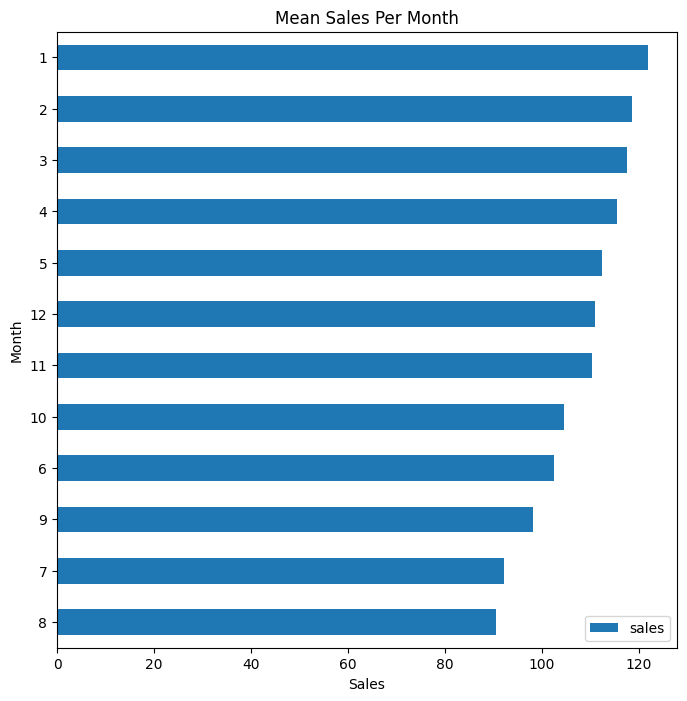

In [45]:
pd.DataFrame(sales_train_df.groupby('Month')['sales'].mean()).sort_values('sales',ascending=True).plot(kind='barh',figsize=(8,8))
plt.title('Mean Sales Per Month')
plt.xlabel('Sales')
plt.show()

### mean sales by day

In [46]:
pd.DataFrame(sales_train_df.groupby('Day')['sales'].mean()).sort_values('sales',ascending=False).style.background_gradient('viridis')

,sales
Day,
21,111.566040
10,111.160400
19,110.831955
20,110.719925
22,110.305626
27,109.797745
11,109.749908
8,109.619286
17,109.611382


### total sales per year

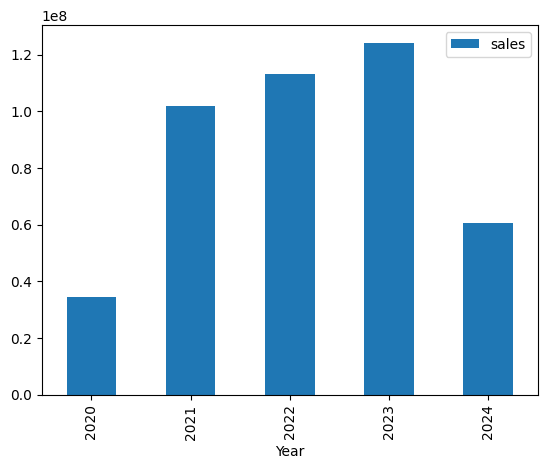

In [47]:
#steady increase till 2023 and sudden drop in 24
pd.DataFrame(sales_train_df.groupby('Year')['sales'].sum()).plot(kind='bar')
plt.show()

In [48]:
sales_train_df.drop('availability',axis=1,inplace=True)

In [49]:
sales_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4007367 entries, 0 to 4007418
Data columns (total 24 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   unique_id              int16         
 1   date                   datetime64[ns]
 2   total_orders           float16       
 3   sales                  float16       
 4   sell_price_main        float16       
 5   type_0_discount        float16       
 6   type_1_discount        float16       
 7   type_2_discount        float16       
 8   type_3_discount        float16       
 9   type_4_discount        float16       
 10  type_5_discount        float16       
 11  type_6_discount        float16       
 12  Year                   int16         
 13  Month                  int16         
 14  Day                    int16         
 15  warehouse_Brno_1       bool          
 16  warehouse_Budapest_1   bool          
 17  warehouse_Frankfurt_1  bool          
 18  warehouse_Munich_1     bool

In [50]:
sales_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47021 entries, 0 to 47020
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   unique_id              47021 non-null  int16         
 1   date                   47021 non-null  datetime64[ns]
 2   total_orders           47021 non-null  float16       
 3   sell_price_main        47021 non-null  float16       
 4   type_0_discount        47021 non-null  float16       
 5   type_1_discount        47021 non-null  float16       
 6   type_2_discount        47021 non-null  float16       
 7   type_3_discount        47021 non-null  float16       
 8   type_4_discount        47021 non-null  float16       
 9   type_5_discount        47021 non-null  float16       
 10  type_6_discount        47021 non-null  float16       
 11  Year                   47021 non-null  int16         
 12  Month                  47021 non-null  int16         
 13  D

In [51]:
sales_train_df.drop('date',axis=1,inplace=True)
sales_test_df.drop('date',axis=1,inplace=True)

### final check

In [52]:
sales_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4007367 entries, 0 to 4007418
Data columns (total 23 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   unique_id              int16  
 1   total_orders           float16
 2   sales                  float16
 3   sell_price_main        float16
 4   type_0_discount        float16
 5   type_1_discount        float16
 6   type_2_discount        float16
 7   type_3_discount        float16
 8   type_4_discount        float16
 9   type_5_discount        float16
 10  type_6_discount        float16
 11  Year                   int16  
 12  Month                  int16  
 13  Day                    int16  
 14  warehouse_Brno_1       bool   
 15  warehouse_Budapest_1   bool   
 16  warehouse_Frankfurt_1  bool   
 17  warehouse_Munich_1     bool   
 18  warehouse_Prague_1     bool   
 19  warehouse_Prague_2     bool   
 20  warehouse_Prague_3     bool   
 21  Discount               bool   
 22  Discount_50            

In [53]:
sales_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47021 entries, 0 to 47020
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   unique_id              47021 non-null  int16  
 1   total_orders           47021 non-null  float16
 2   sell_price_main        47021 non-null  float16
 3   type_0_discount        47021 non-null  float16
 4   type_1_discount        47021 non-null  float16
 5   type_2_discount        47021 non-null  float16
 6   type_3_discount        47021 non-null  float16
 7   type_4_discount        47021 non-null  float16
 8   type_5_discount        47021 non-null  float16
 9   type_6_discount        47021 non-null  float16
 10  Year                   47021 non-null  int16  
 11  Month                  47021 non-null  int16  
 12  Day                    47021 non-null  int16  
 13  warehouse_Brno_1       47021 non-null  bool   
 14  warehouse_Budapest_1   47021 non-null  bool   
 15  wa

### split data

In [55]:
from sklearn.model_selection import train_test_split
X_train = sales_train_df.drop('sales',axis=1)
y_train = sales_train_df['sales']
X_test = sales_test_df
X_train,X_val,y_train,y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=33)

In [56]:
from sklearn.preprocessing import StandardScaler
st_sclr = StandardScaler()
X_train = st_sclr.fit_transform(X_train)
X_val = st_sclr.transform(X_val)
X_test = st_sclr.transform(X_test)

### simple linear regression model

In [65]:
import time
def train_model(model,name,X_train=X_train,y_train=y_train,X_test=X_test,X_val=X_val,y_val=y_val):
    #fit model
    print(name,"\n")
    start = time.time()
    model.fit(X_train,y_train)
    #validation check
    pred_test = model.predict(X_test)
    pred_model_val = model.predict(X_val)
    end = time.time()
    print(f"Time Taken for Train + Pred : {(end-start)} sec")
    print(f"R2 Score : {r2_score(y_val,pred_model_val)}","\n")
    print(f"RMSE : {np.sqrt(mean_squared_error(y_val,pred_model_val))}","\n")
    print(f"MAE : {(mean_absolute_error(y_val,pred_model_val))}","\n")
    new_test_df = pd.read_csv('sales_test.csv')
    new_test_df['id'] = new_test_df['unique_id'].apply(lambda x : str(x)) + "_" + new_test_df['date']
    pred_df = pd.DataFrame(pred_test,columns=["num_sold"])
    pred_df = pd.concat([pred_df,new_test_df['id']],axis=1)
    pred_df.set_index("id",inplace=True)
    pred_df.to_csv("Forecast_KC_"+str(name)+".csv")

In [68]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
train_model(lr,"Linear Regression")

Linear Regression 

Time Taken for Train + Pred : 0.5799710750579834 sec
R2 Score : 0.040859878063201904 

RMSE : 359.32421875 

MAE : 106.41063690185547 



In [69]:
from sklearn.tree import DecisionTreeRegressor
dtree = DecisionTreeRegressor()
train_model(dtree,"DTREE")

DTREE 

Time Taken for Train + Pred : 19.212360858917236 sec
R2 Score : 0.9455161651108543 

RMSE : 85.64051971195282 

MAE : 26.350035853731676 



In [ ]:
from sklearn.ensemble import RandomForestRegressor
rfc = RandomForestRegressor()
train_model(rfc,"RFC")

RFC 

